In [1]:
import numpy as np
from eryn.backends import HDFBackend as eryn_HDF_Backend
import matplotlib.pyplot as plt
import corner
import os
import warnings
import matplotlib.lines as mlines
from matplotlib.font_manager import FontProperties
plt.rcParams['font.size'] = 20

notebook_direc = os.getcwd()
plot_direc = notebook_direc + "/corner_plots"
run_direc = "/work/scratch/data/burkeol/kerr_few_paper/Pure_Kerr_MCMC/"

os.listdir(run_direc)

['cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_5_T_2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2_eps_1e-2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2_eps_1e-5.h5',
 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_dist_7p66_SNR_20_dt_5_T_2_eps_1e-2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e4_a_0p95_p0_133p4623_e0_0p85_dist_10_SNR_212_dt_5_T_2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2.h5',
 'cluster_kerr_inj_kerr_recov_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_dist_7p66_SNR_20_dt_5_T_2_eps_1e-5_truth.h5',
 'cluster_kerr_inj_kerr_recov_M_1e5_mu_

In [2]:
# Now analyse the results using 9PN for circular orbits
    
def analyse_samples(file_path, discard = 0):
    reader = eryn_HDF_Backend(file_path,read_only = True)

    N_iterations = reader.get_chain()['model_0'].shape[0]
    N_temps = reader.get_chain()['model_0'].shape[1]
    N_walkers = reader.get_chain()['model_0'].shape[2]
    N_params = reader.get_chain()['model_0'].shape[-1]

    samples_after_burnin = [reader.get_chain(discard = discard)['model_0'][:,i].reshape(-1,N_params) 
                        for i in range(N_temps)]  # Take true chain]


    log_like = reader.get_log_like(discard = discard)
    plt.plot(log_like[:,0,:]);
    plt.xlabel(r'Iteration')
    plt.ylabel(r'Log likelihood')
    plt.show()
    return samples_after_burnin, reader, log_like, N_params,

def corner_plot(burned_samples, true_params, param_labels, corner_kwargs, title = r'Corner plot', plot_name = None):

    N_params = len(param_labels)
    true_params = true_params[0:N_params]
    trunc_samples = burned_samples[0][:,:N_params]
    print(trunc_samples.shape)
    
    samples_corner = np.column_stack(trunc_samples)

    figure = corner.corner(trunc_samples,bins = 30, color = 'blue', **corner_kwargs)

    
    axes = np.array(figure.axes).reshape((N_params, N_params))

    for i in range(N_params):
        ax = axes[i, i]
        ax.axvline(true_params[i], color="k")

    for yi in range(N_params):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axhline(true_params[yi], color="k")
            ax.axvline(true_params[xi],color= "k")
            ax.plot(true_params[xi], true_params[yi], "sk")

    for ax in figure.get_axes():
        ax.tick_params(axis='both', labelsize=18)

    blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
    black_line = mlines.Line2D([], [], color='black', label='True Value')

    # plt.legend(handles=[blue_line,black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = title, title_fontproperties = FontProperties(size = , weight = 'bold'))
    # plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)
    if plot_name:
        plt.savefig(plot_name, bbox_inches = "tight")
    return figure



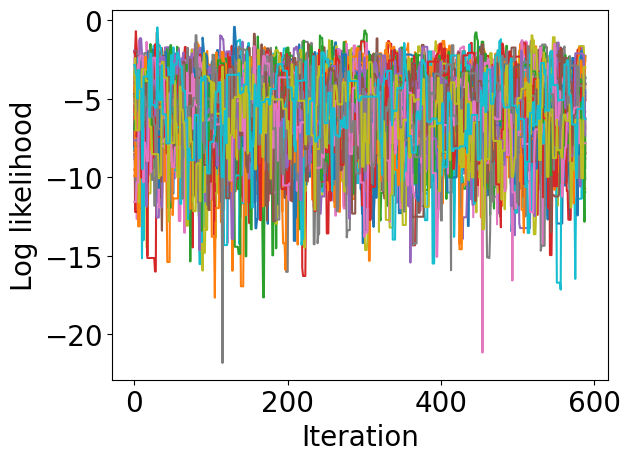

In [3]:
file_path = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2_eps_1e-5.h5'

samples_after_burnin_IMRI, reader_IMRI, log_like_IMRI, N_params = analyse_samples(file_path, discard = 400)

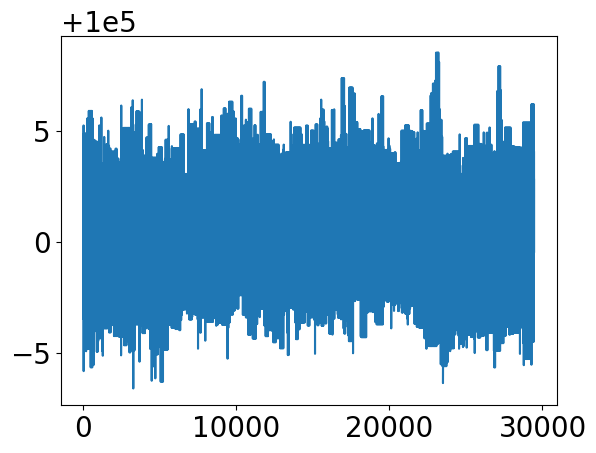

In [4]:
plt.plot(samples_after_burnin_IMRI[0][:,0])

(29450, 5)


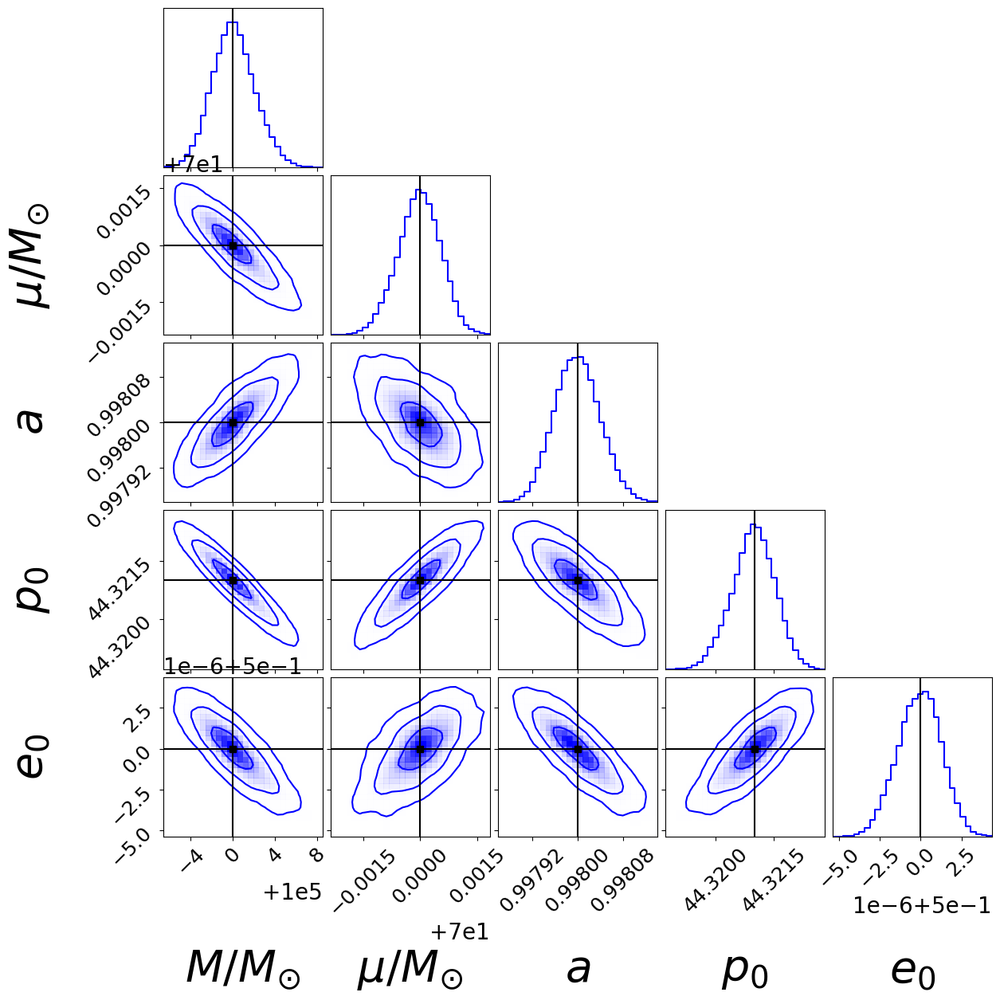

In [5]:
IMRI_plot_name = plot_direc + "/M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2.png"


params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals = np.array([1e5,70,0.998, 44.321, 0.5, 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_IMRI = corner_plot(samples_after_burnin_IMRI, true_vals, params_label, corner_kwargs, plot_name = None)#IMRI_plot_name)

In [6]:
trunc_samps = samples_after_burnin_IMRI[0][-20000:,:]
Cov_Matrix = np.cov(trunc_samps,rowvar = False)
np.save("Data/Cov_Matrices/Cov_Matrix_PE_M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2.npy",Cov_Matrix)


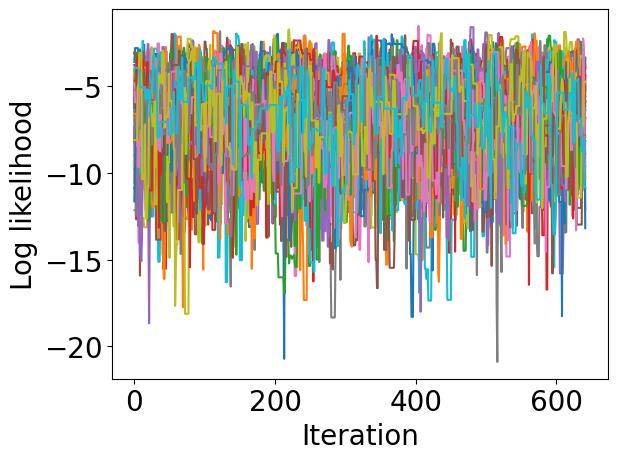

In [7]:
file_path = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2_eps_1e-2.h5'

samples_after_burnin_IMRI_eps_1eneg2, reader_IMRI_eps_1eneg2, log_like_IMRI_eps_1eneg2, N_params = analyse_samples(file_path, discard = 500)

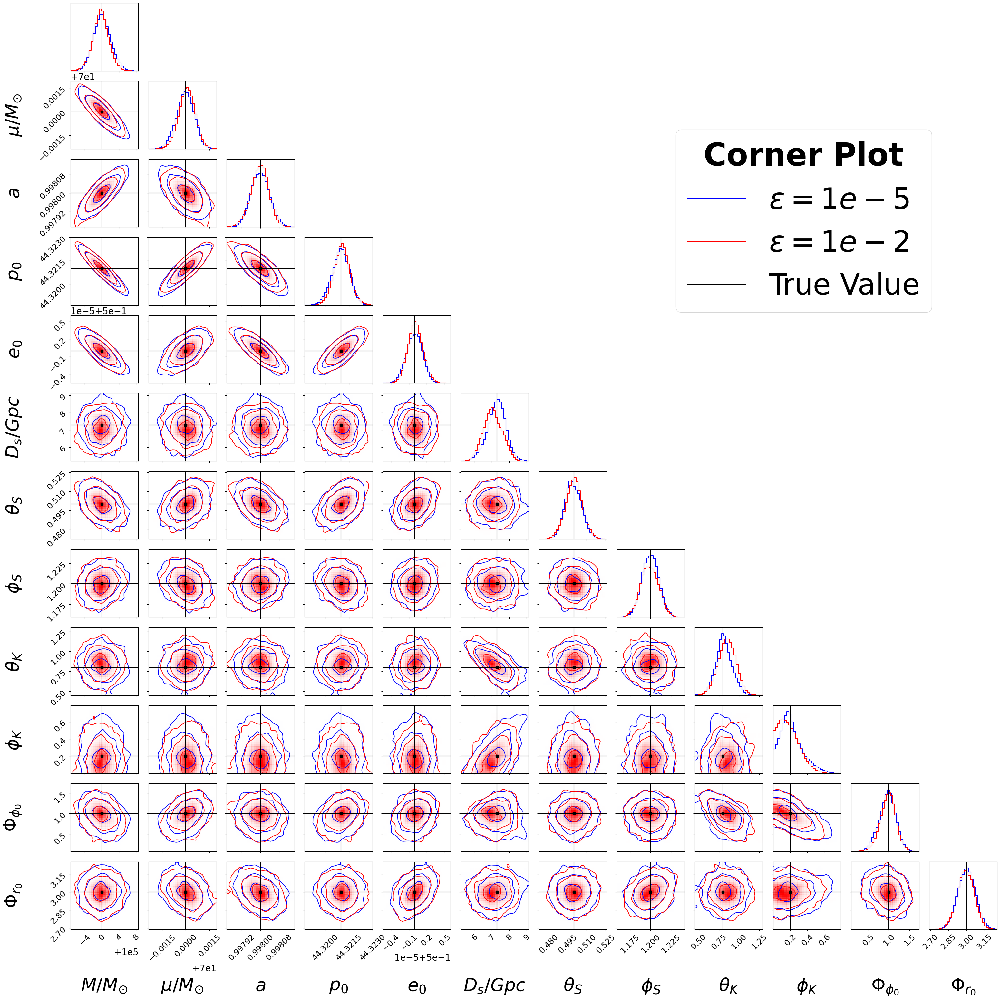

In [8]:
# Check with eps = 1e-5 and eps = 1e-2 

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(samples_after_burnin_IMRI)
samples_corner_1eneg2 = np.column_stack(samples_after_burnin_IMRI_eps_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals[yi], color="k")
        ax.axvline(true_vals[xi],color= "k")
        ax.plot(true_vals[xi], true_vals[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



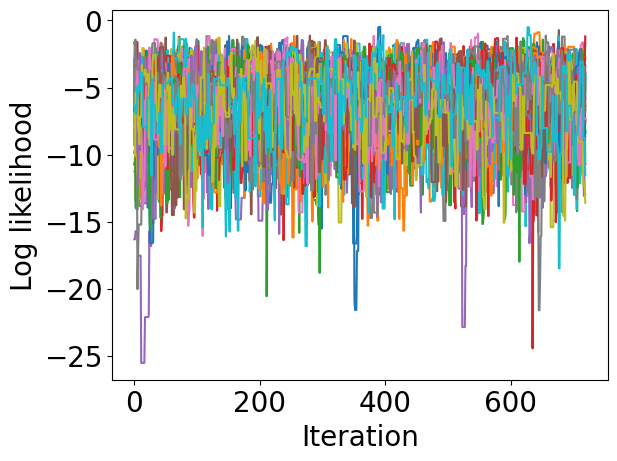

In [9]:
file_path = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_dist_7p66_SNR_20_dt_5_T_2_eps_1e-5_truth.h5'

samples_after_burnin_EMRI, reader_EMRI, log_like_EMRI, N_params = analyse_samples(file_path, discard = 800)

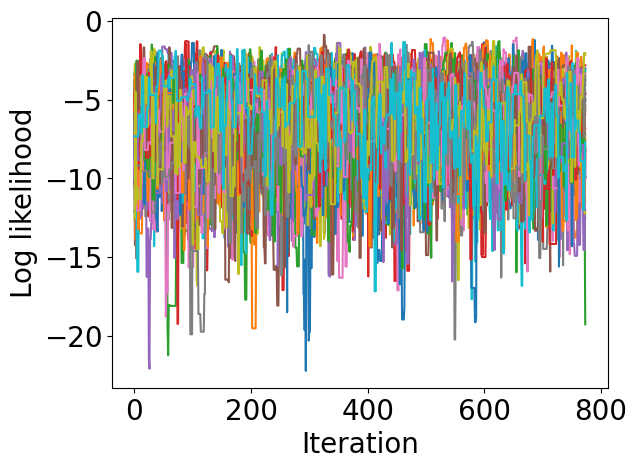

In [10]:
file_path = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_dist_7p66_SNR_20_dt_5_T_2_eps_1e-2.h5'

samples_after_burnin_EMRI_1eneg2, reader_EMRI_1eneg2, log_like_EMRI_1eneg2, N_params = analyse_samples(file_path, discard = 800)

(36000, 5)


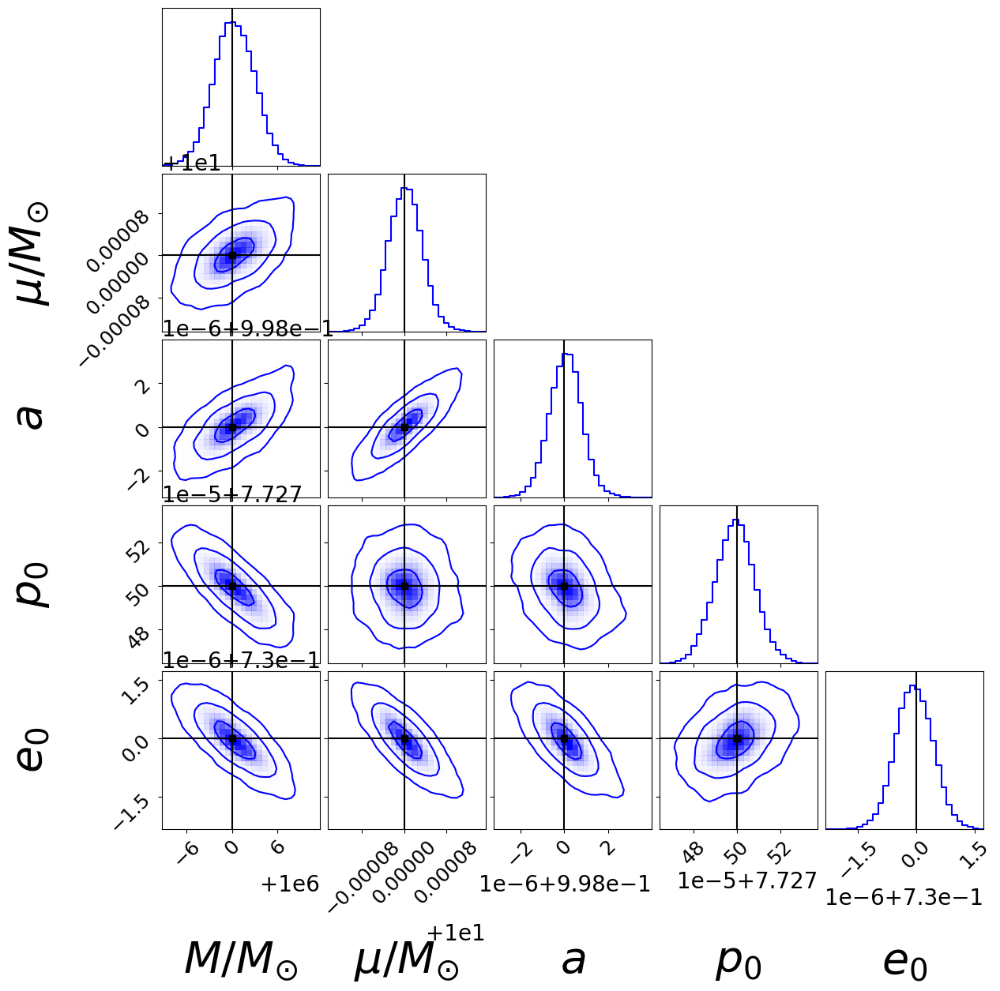

In [11]:
EMRI_plot_name = plot_direc + "/M_1e6_mu_10_a_0p998_e0_0p73_p0_7p7275_e0_0p73_dist_7p66_SNR_20_dt_5_T_2_eps_1e-5_truth.png"

params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals_EMRI = np.array([1e6,10,0.998, 7.7275, 0.73, 7.6, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])
figure_EMRI = corner_plot(samples_after_burnin_EMRI, true_vals_EMRI, params_label,corner_kwargs, plot_name = EMRI_plot_name)

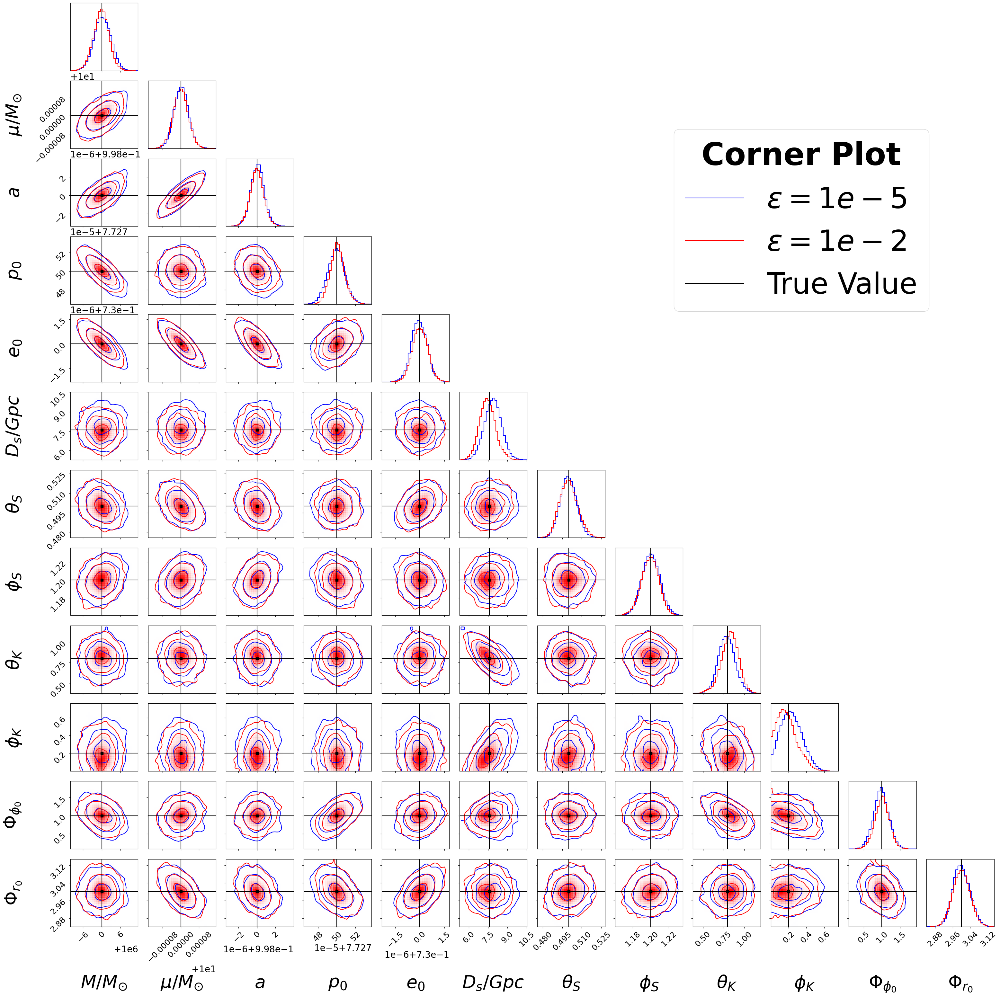

In [12]:
# Check with eps = 1e-5 and eps = 1e-2 

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(samples_after_burnin_EMRI)
samples_corner_1eneg2 = np.column_stack(samples_after_burnin_EMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI[yi], color="k")
        ax.axvline(true_vals_EMRI[xi],color= "k")
        ax.plot(true_vals_EMRI[xi], true_vals_EMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



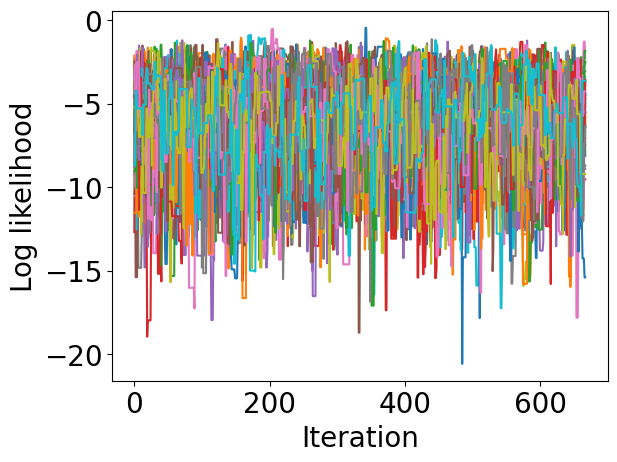

In [13]:
file_path_mega_IMRI_wide_prior = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e5_a_0p95_p0_23p6015_e0_0p85_dist_7p5_SNR_485_dt_10_T_2_wide_prior_mu.h5'

samples_after_burnin_mega_IMRI_wide_prior, reader_IMRI_wide_prior, log_like_mega_IMRI_wide_prior, _ = analyse_samples(file_path_mega_IMRI_wide_prior, discard = 200)


In [14]:
trunc_samps = samples_after_burnin_mega_IMRI_wide_prior[0][-20000:,:]
Cov_Matrix = np.cov(trunc_samps,rowvar = False)
np.save("Data/Cov_Matrices/Cov_Matrix_PE_M_1e7_mu_1e5_a_0p95_p0_23p6015_e0_0p85_dist_7p5_SNR_485_dt_10_T_2_wide_prior_mu.npy",Cov_Matrix)


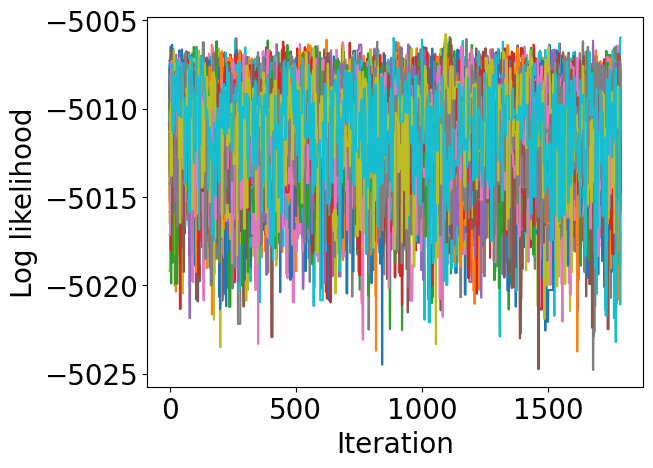

In [65]:
file_path_mega_IMRI_wide_prior_1eneg2 = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e5_a_0p95_p0_23p6015_e0_0p85_dist_7p5_SNR_485_dt_10_T_2_wide_prior_mu_eps_1e-2.h5'

samples_after_burnin_mega_IMRI_wide_prior_1eneg2, reader_IMRI_wide_prior_1eneg2, log_like_mega_IMRI_wide_prior_1eneg2, _ = analyse_samples(file_path_mega_IMRI_wide_prior_1eneg2, discard = 1500)


(33400, 5)


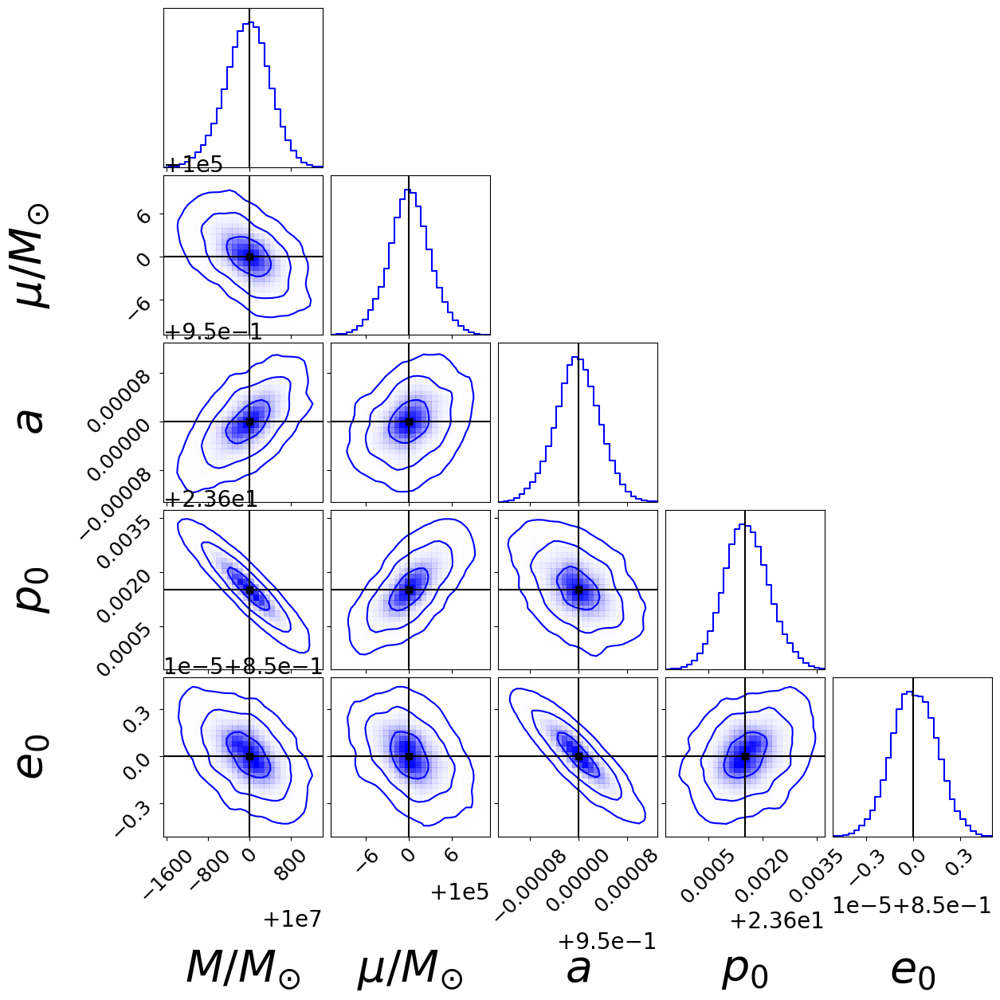

In [16]:
mega_IMRI_plot_name_wide_prior = plot_direc + "/M_1e7_mu_1e5_a_0p95_p0_23p6015_e0_0p85_dist_7p25_SNR_480_dt_10_T_2.png"

params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals_mega_IMRI = np.array([1e7,1e5,0.95, 23.6015, 0.85, 7.25, 0.5, 1.2, 0.8, 0.2, 2.0, 4.0])

corner_kwargs_mega_IMRI = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=20), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_mega_IMRI = corner_plot(samples_after_burnin_mega_IMRI_wide_prior, true_vals_mega_IMRI, params_label, corner_kwargs, plot_name = mega_IMRI_plot_name_wide_prior)

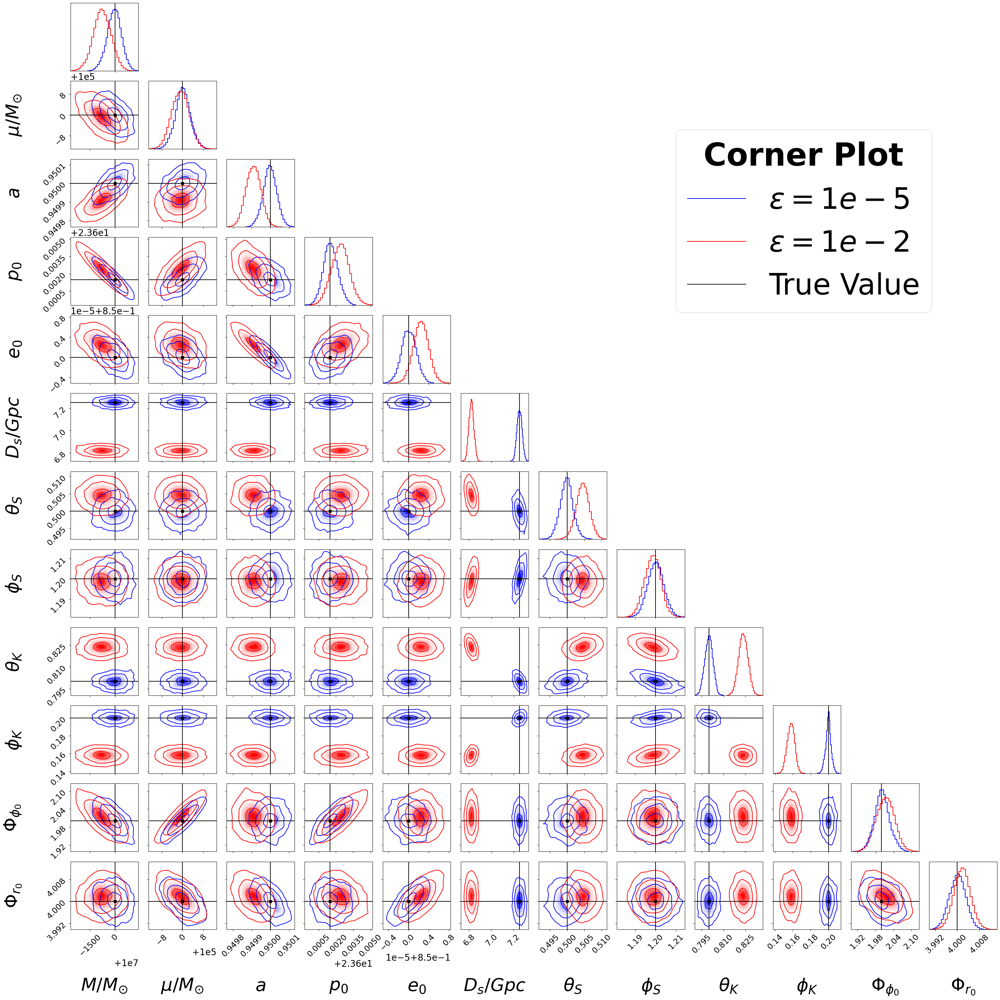

In [17]:
# Check with eps = 1e-5 and eps = 1e-2 

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(samples_after_burnin_mega_IMRI_wide_prior)
samples_corner_1eneg2 = np.column_stack(samples_after_burnin_mega_IMRI_wide_prior_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_mega_IMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_mega_IMRI[yi], color="k")
        ax.axvline(true_vals_mega_IMRI[xi],color= "k")
        ax.plot(true_vals_mega_IMRI[xi], true_vals_mega_IMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



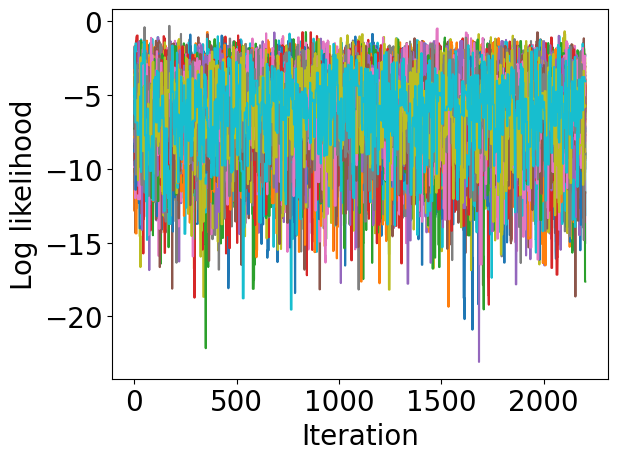

In [18]:
file_path_light_IMRI = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_5_T_2.h5'

samples_after_burnin_light_IMRI_eps_1eneg5, reader_light_IMRI, log_like_light_IMRI, _ = analyse_samples(file_path_light_IMRI, discard = 200)


(110200, 5)


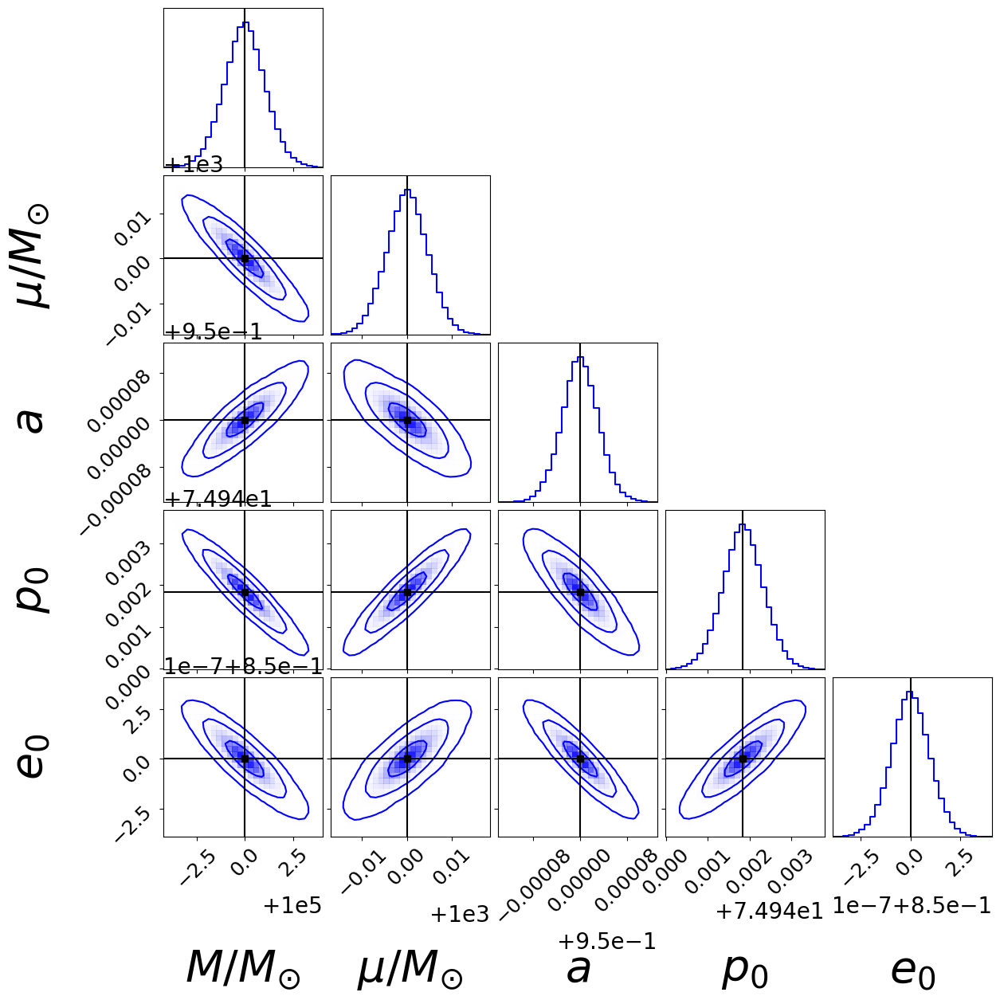

In [19]:
light_IMRI_plot_name = plot_direc + "/M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_5_T_2.png"

params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals_light_IMRI = np.array([1e5,1e3,0.95, 74.94184, 0.85, 2, 0.5, 1.2, 0.8, 0.2, 2.0, 4.0])

corner_kwargs_mega_IMRI = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=20), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_light_IMRI = corner_plot(samples_after_burnin_light_IMRI_eps_1eneg5, true_vals_light_IMRI, params_label, corner_kwargs, plot_name = light_IMRI_plot_name)

In [20]:
'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-4.h5'

'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-4.h5'

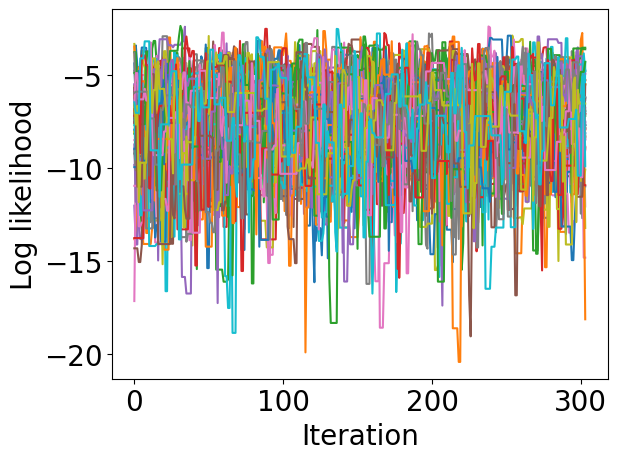

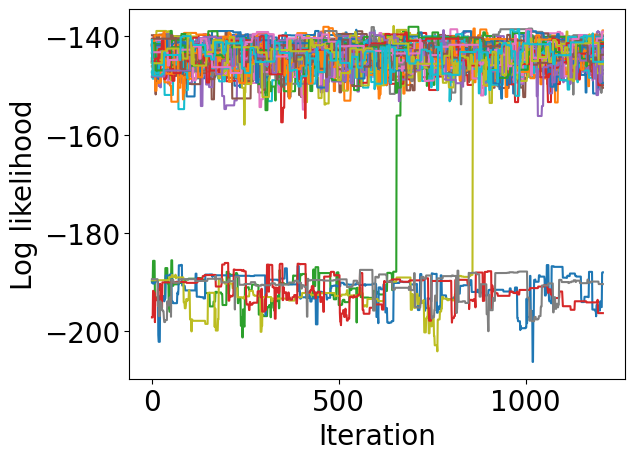

(60400,)


In [62]:
file_path_light_IMRI_eps_1eneg4 = run_direc +  'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-4.h5'
file_path_light_IMRI_eps_1eneg2 = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-2.h5' 

samples_after_burnin_light_IMRI_eps_1eneg4, reader_light_IMRI_eps_1eneg4, log_like_light_IMRI_eps_1eneg4, _ = analyse_samples(file_path_light_IMRI_eps_1eneg4, discard = 700)

samples_after_burnin_light_IMRI_eps_1eneg2, reader_light_IMRI_eps_1eneg2, log_like_light_IMRI_eps_1eneg2, _ = analyse_samples(file_path_light_IMRI_eps_1eneg2, discard = 2000)

print(samples_after_burnin_light_IMRI_eps_1eneg2[0][:,0].shape)


In [42]:
# Clear out some of the secondaries

reader_light_IMRI = eryn_HDF_Backend(run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e3_a_0p95_p0_74p94184_e0_0p85_dist_2_SNR_443_dt_2_T_2_eps_1e-2.h5',read_only = True)

N_iterations = reader_light_IMRI.get_chain()['model_0'].shape[0]
N_temps = reader_light_IMRI.get_chain()['model_0'].shape[1]
N_walkers = reader_light_IMRI.get_chain()['model_0'].shape[2]
N_params = reader_light_IMRI.get_chain()['model_0'].shape[-1]

burn = 2000
samples_light_IMRI = reader_light_IMRI.get_chain(discard = burn)['model_0']


log_like_IMRI = reader_light_IMRI.get_log_like(discard = burn)


In [44]:
samples_after_burnin_light_IMRI.shape, log_like_IMRI.shape

((1208, 1, 50, 1, 12), (1208, 1, 50))

In [46]:
import numpy as np

# Define the log-likelihood threshold
log_like_threshold = -170

# Identify walkers that ever go below the threshold
bad_walkers = np.any(log_like_IMRI < log_like_threshold, axis=0)  # Shape: (1, 50)

# Convert to boolean mask (negate to keep good walkers)
good_walkers_mask = ~bad_walkers.squeeze()  # Shape: (50,)

# Apply the mask to remove bad walkers
filtered_log_like_IMRI = log_like_IMRI[:, :, good_walkers_mask]  # New shape: (1208, 1, <fewer walkers>)
filtered_samples_light_IMRI = samples_light_IMRI[:, :, good_walkers_mask, :, :]  # New shape: (1208, 1, <fewer walkers>, 1, 12)

# Print new shapes
print("Filtered log_like_IMRI shape:", filtered_log_like_IMRI.shape)
print("Filtered samples_light_IMRI shape:", filtered_samples_light_IMRI.shape)

Filtered log_like_IMRI shape: (1208, 1, 45)
Filtered samples_light_IMRI shape: (1208, 1, 45, 1, 12)


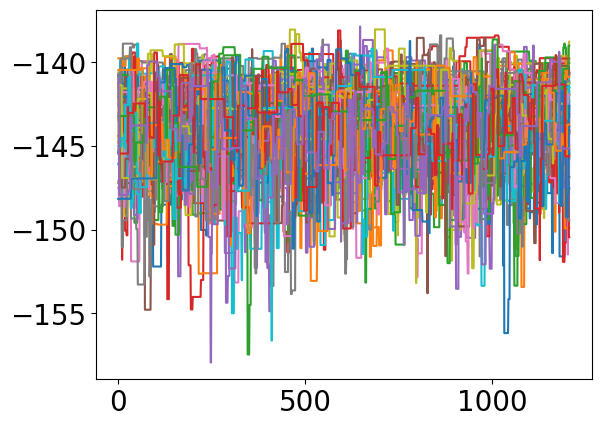

In [53]:
plt.plot(filtered_log_like_IMRI[:,0,:]);plt.show()

samples_after_burnin_and_clean_IMRI_1eneg2 = [filtered_samples_light_IMRI[:,i].reshape(-1,N_params) 
                        for i in range(N_temps)]  # Take true chain]

<Figure size 640x480 with 0 Axes>

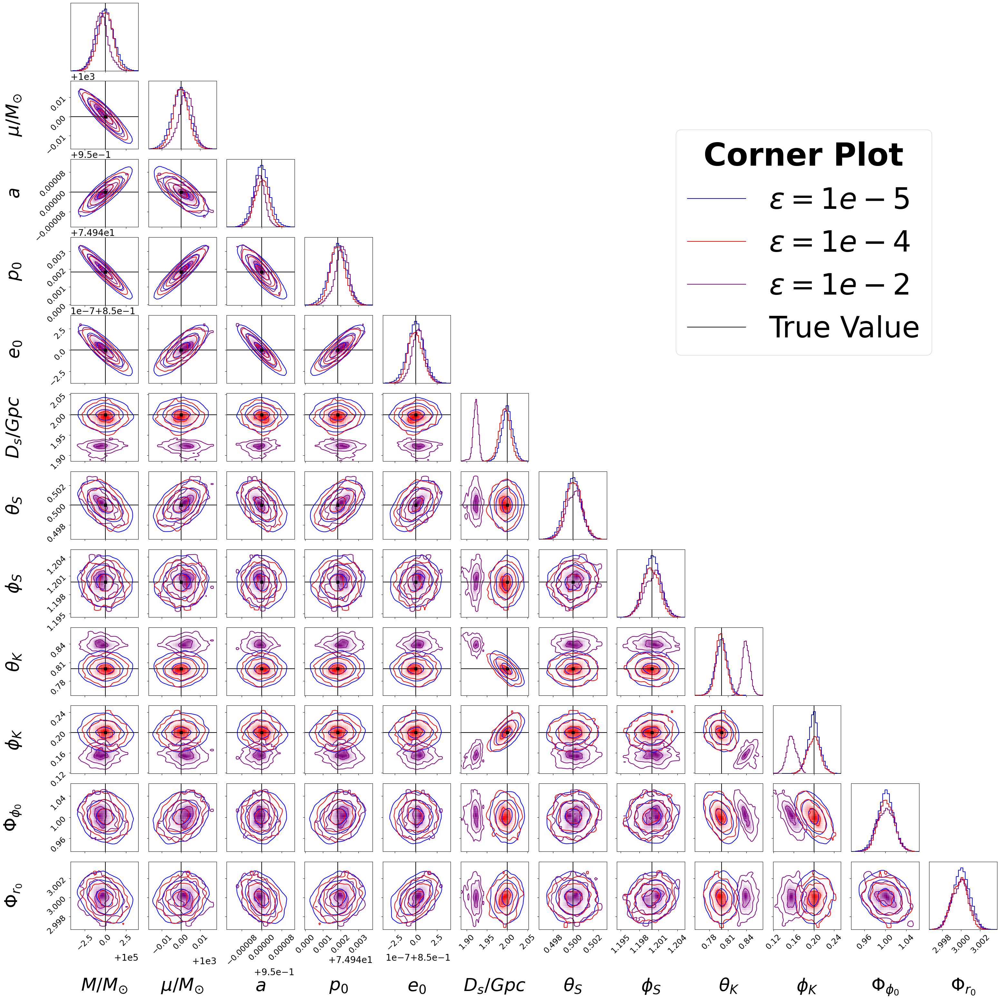

In [63]:
# Check with eps = 1e-5 and eps = 1e-2 
plt.clf()
params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(samples_after_burnin_light_IMRI_eps_1eneg5)
samples_corner_1eneg4 = np.column_stack(samples_after_burnin_light_IMRI_eps_1eneg4)
samples_corner_1eneg2 = np.column_stack(samples_after_burnin_and_clean_IMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights_neg4 = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg4[:,0]))*np.ones(len(samples_corner_1eneg4[:,0]))
weights_neg2 = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg4, fig = figure, bins = 30, weights = weights_neg4, color = 'red', **corner_kwargs)
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights_neg2, color = 'purple', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_light_IMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_light_IMRI[yi], color="k")
        ax.axvline(true_vals_light_IMRI[xi],color= "k")
        ax.plot(true_vals_light_IMRI[xi], true_vals_light_IMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-4$')
purple_line = mlines.Line2D([], [], color='purple', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, purple_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



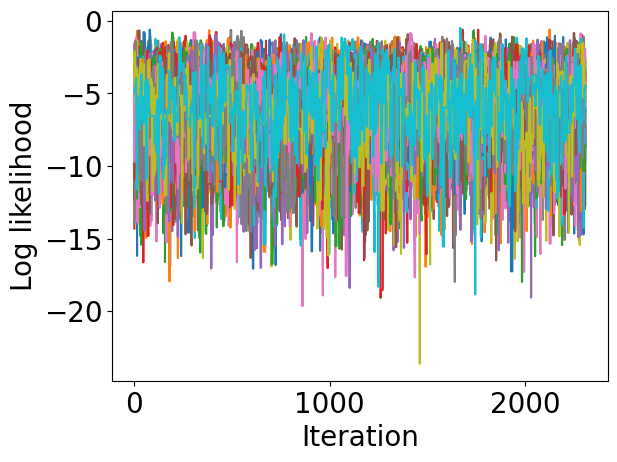

In [23]:
file_path_q10 = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e5_mu_1e4_a_0p95_p0_133p4623_e0_0p85_dist_10_SNR_212_dt_5_T_2.h5'

samples_after_burnin_q10, reader_q10, log_like_q10, _ = analyse_samples(file_path_q10, discard = 200)


In [24]:
trunc_samps = samples_after_burnin_q10[0][-20000:,:]
Cov_Matrix = np.cov(trunc_samps,rowvar = False)
np.save("Data/Cov_Matrices/Cov_Matrix_PE_M_1e5_mu_1e4_a_0p95_p0_133p4623_e0_0p85_dist_10_SNR_212_dt_5_T_2",Cov_Matrix)


(115450, 5)


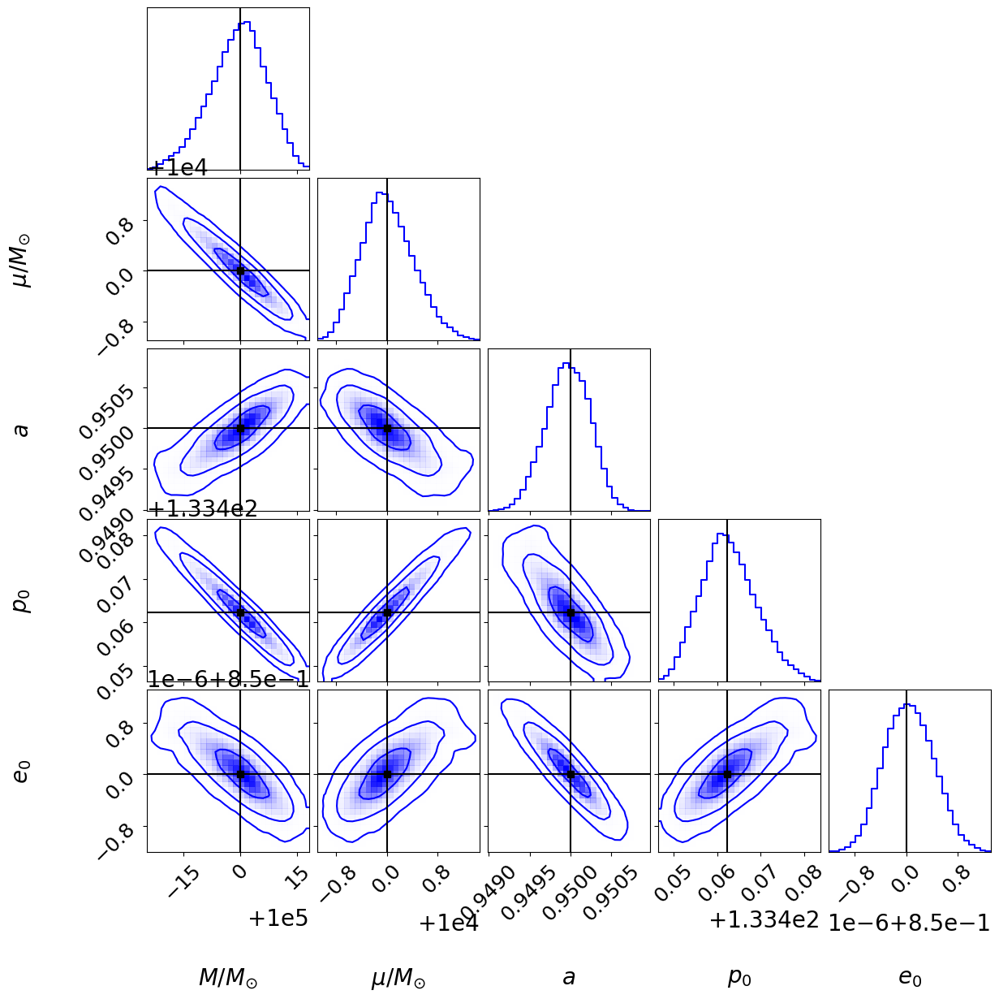

In [25]:
q10_plot_name = plot_direc + "/M_1e5_mu_1e4_a_0p95_p0_133p4623_e0_0p85_dist_10_SNR_212_dt_5_T_2.png"

params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals_q10 = np.array([1e5,1e4,0.95, 133.4623, 0.85, 10, 0.5, 1.2, 0.8, 0.2, 2.0, 4.0])

corner_kwargs_q10 = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=20), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_q10 = corner_plot(samples_after_burnin_q10, true_vals_q10, params_label, corner_kwargs_q10, plot_name = q10_plot_name)

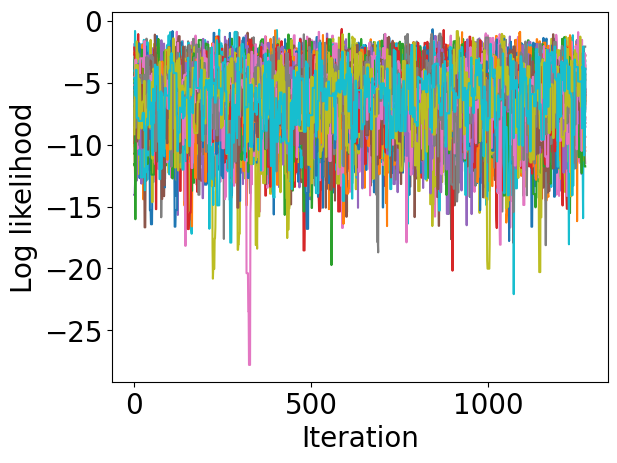

In [26]:
file_path_mega_EMRI = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.h5'

samples_after_burnin_mega_EMRI, reader_mega_EMRI, log_like_mega_EMRI, _ = analyse_samples(file_path_mega_EMRI, discard = 1000)


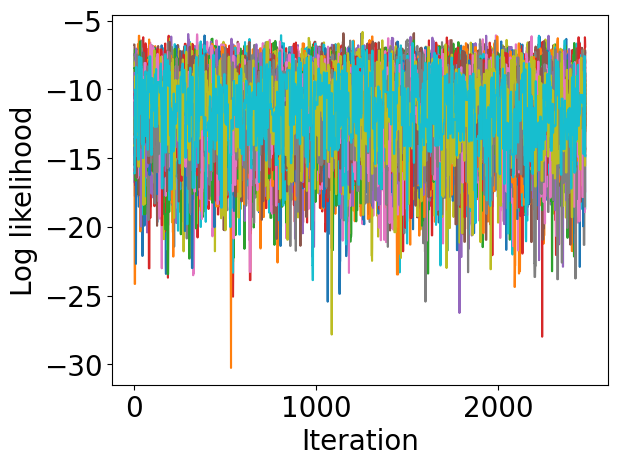

In [27]:
file_path_mega_EMRI_eps_1eneg2 = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2_eps_1e-2.h5'

samples_after_burnin_mega_EMRI_eps_1eneg2, reader_mega_EMRI_eps_1eneg2, log_like_mega_EMRI_eps_1eneg2, _ = analyse_samples(file_path_mega_EMRI_eps_1eneg2, discard = 1000)


In [28]:
trunc_samps = samples_after_burnin_mega_EMRI[0][-20000:,:]
Cov_Matrix = np.cov(trunc_samps,rowvar = False)
np.save("Data/Cov_Matrices/Cov_Matrix_PE_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.npy",Cov_Matrix)


(63750, 5)


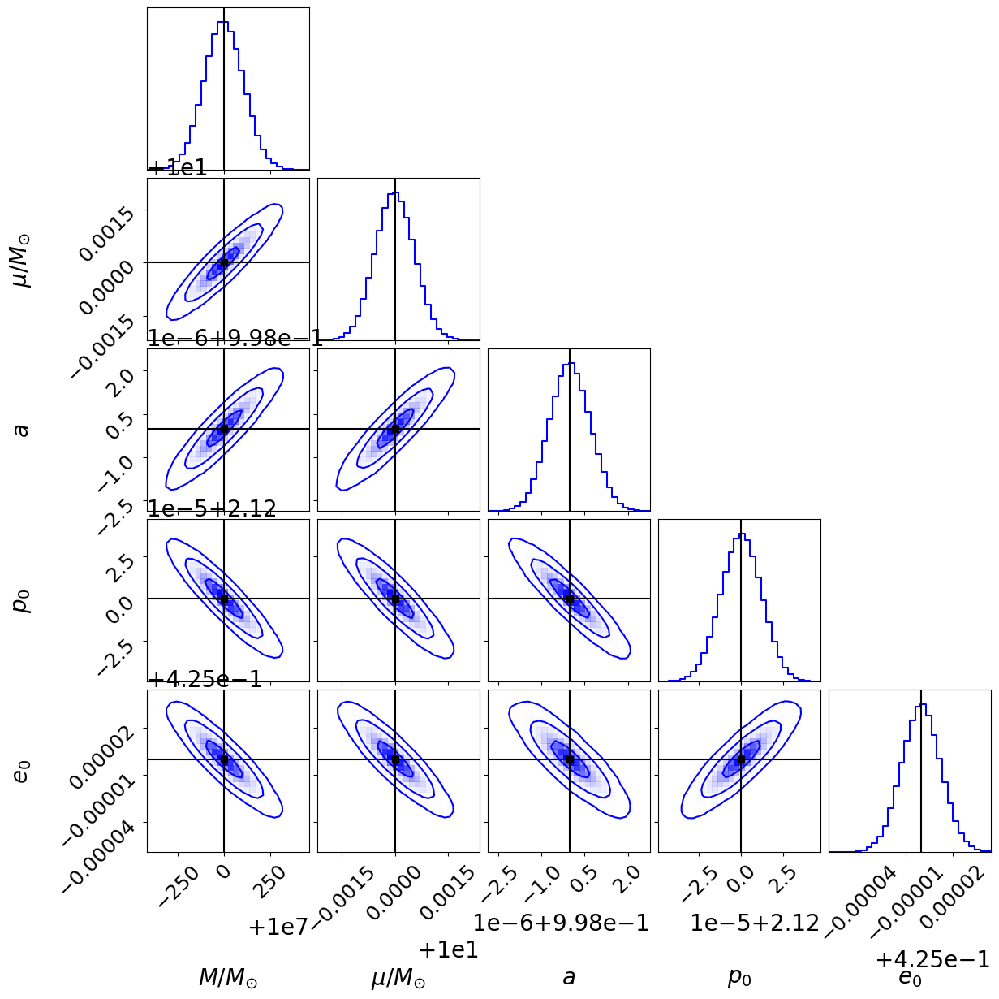

In [29]:
mega_EMRI_plot_name = plot_direc + "/M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.png"

params_label =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$"] 

true_vals_mega_EMRI = np.array([1e7,1e1,0.998, 2.12, 0.425, 5.465, 0.5, 1.2, 0.8, 0.2, 2.0, 3.0])

corner_kwargs_mega_EMRI = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=20), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

figure_q10 = corner_plot(samples_after_burnin_mega_EMRI, true_vals_mega_EMRI, params_label, corner_kwargs_mega_EMRI, plot_name = mega_EMRI_plot_name)

In [30]:
samples_corner_1eneg5[:,0].shape

(110200,)

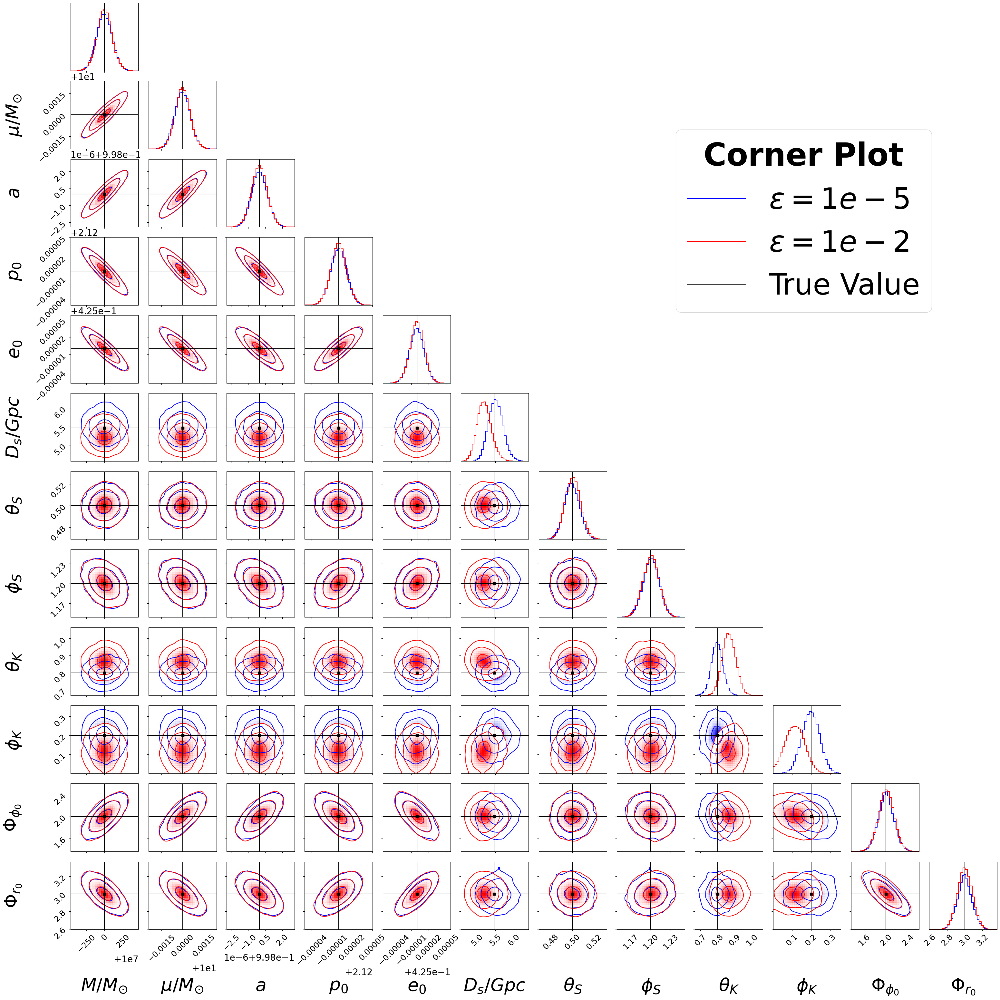

In [31]:
# Check with eps = 1e-5 and eps = 1e-2 

params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(samples_after_burnin_mega_EMRI)
samples_corner_1eneg2 = np.column_stack(samples_after_burnin_mega_EMRI_eps_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_mega_EMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_mega_EMRI[yi], color="k")
        ax.axvline(true_vals_mega_EMRI[xi],color= "k")
        ax.plot(true_vals_mega_EMRI[xi], true_vals_mega_EMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-2$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [32]:
Cov_Matrix_mega_EMRI = np.cov(samples_after_burnin_mega_EMRI[0][-100000:,:],rowvar = False)
np.save("Data/Cov_Matrix_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.png", Cov_Matrix_mega_EMRI)

In [33]:
# Check with the Fisher matrix?

FM_cov_matrix = np.load("Data/Cov_Matrices/FM_cov_matrices/M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.npy")

samples_from_FM = np.random.multivariate_normal(true_vals_mega_EMRI, FM_cov_matrix, 20000)

FileNotFoundError: [Errno 2] No such file or directory: 'Data/Cov_Matrices/FM_cov_matrices/M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.npy'

In [ ]:
params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs_FM_MCMC = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner = np.column_stack(samples_after_burnin_mega_EMRI)

figure = corner.corner(samples_corner,bins = 30, color = 'blue', **corner_kwargs_FM_MCMC)

weights = (len(samples_corner)/len(samples_from_FM))*np.ones(len(samples_from_FM))
corner.corner(samples_from_FM, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs_FM_MCMC)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_mega_EMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_mega_EMRI[yi], color="k")
        ax.axvline(true_vals_mega_EMRI[xi],color= "k")
        ax.plot(true_vals_mega_EMRI[xi], true_vals_mega_EMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)

# plt.savefig("corner_plots/" + "FM_vs_MCMC_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.png", bbox_inches = "tight")




In [ ]:
os.listdir("Data/Cov_Matrices/")

In [ ]:
# Check with the Fisher matrix?

FM_cov_matrix_M1e5_mu70 = np.load("Data/Cov_Matrices/FM_cov_matrices/M_1e5_mu_70_a_0p998_p0_44p321_e0_0p5_dist_7p28_SNR_30_dt_5_T_2.npy")
# FM_cov_matrix_M1e5_mu70 = np.load('Data/Cov_Matrices/Cov_Matrix_PE_M_1e7_mu_1e1_a_0p998_p0_2p12_e0_0p425_dist_5p465_SNR_30_dt_10_T_2.npy')
true_vals_M1e5_mu70 = np.array([1e5,70,0.998, 44.321, 0.5, 7.28, 0.5, 1.2, 0.8, 0.2, 1.0, 3.0])

samples_from_FM_IMRI_M1e5_mu70 = np.random.multivariate_normal(true_vals_M1e5_mu70, FM_cov_matrix_M1e5_mu70, 20000)



In [ ]:
params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs_FM_MCMC = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner = np.column_stack(samples_after_burnin_IMRI)

figure = corner.corner(samples_corner,bins = 30, color = 'blue', **corner_kwargs_FM_MCMC)

weights = (len(samples_corner)/len(samples_from_FM))*np.ones(len(samples_from_FM))
corner.corner(samples_from_FM_IMRI_M1e5_mu70, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs_FM_MCMC)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_M1e5_mu70[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_M1e5_mu70[yi], color="k")
        ax.axvline(true_vals_M1e5_mu70[xi],color= "k")
        ax.plot(true_vals_M1e5_mu70[xi], true_vals_M1e5_mu70[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)


In [ ]:
file_path_canonical_EMRI = run_direc + 'cluster_kerr_inj_kerr_recov_M_1e6_mu_1e1_a_0p99_p0_7p85_e0_0p7_dist_3p429_SNR_50_dt_10_T_2.h5'

samples_after_burnin_canonical_EMRI, reader_EMRI, log_like_EMRI, N_params = analyse_samples(file_path_canonical_EMRI, discard = 0)

In [ ]:
# Remove the secondaries. Urgh. Started too far away... madness.

collected_samps_burned_EMRI_clean = []

N_iterations = reader_EMRI.get_chain()['model_0'].shape[0]
N_temps = reader_EMRI.get_chain()['model_0'].shape[1]
N_walkers = reader_EMRI.get_chain()['model_0'].shape[2]
N_params = reader_EMRI.get_chain()['model_0'].shape[-1]

from tqdm import tqdm as tqdm
for N in tqdm(range(N_params)):

    param = np.array([reader_EMRI.get_chain(discard = 1000)['model_0'][:,:,w,:,N].flatten() for w in range(N_walkers) 
                  if min(reader_EMRI.get_log_like(discard = 1000)[:,0,w]) > -30])
    
    param_array = np.array(param).flatten()
    collected_samps_burned_EMRI_clean.append(param_array)

collected_samps_burned_EMRI_clean = np.asarray(collected_samps_burned_EMRI_clean)

In [ ]:
# Check with the Fisher matrix?

FM_cov_matrix_M1e6_mu10 = np.load("Data/Cov_Matrices/FM_cov_matrices/M_1e6_mu_1e1_a_0p99_p0_7p85_e0_0p7_dist_3p429_SNR_50_dt_10_T_2.npy")
true_vals_canonical_EMRI = np.array([1e6,10,0.99, 7.85, 0.7, 3.429, 0.5, 1.2, 0.8, 0.2, 2.0, 3.0])

samples_from_FM_EMRI_M1e6_mu10 = np.random.multivariate_normal(true_vals_canonical_EMRI, FM_cov_matrix_M1e6_mu10, len(collected_samps_burned_EMRI_clean[0]))

In [ ]:


params_label_full =[r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                     r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                     r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                     r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"] 

corner_kwargs_FM_MCMC = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner = np.column_stack(collected_samps_burned_EMRI_clean)

figure = corner.corner(samples_corner,bins = 30, color = 'blue', **corner_kwargs_FM_MCMC)

weights = (len(samples_corner)/len(samples_from_FM_EMRI_M1e6_mu10))*np.ones(len(samples_from_FM_EMRI_M1e6_mu10))
corner.corner(samples_from_FM_EMRI_M1e6_mu10, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs_FM_MCMC)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_canonical_EMRI[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_canonical_EMRI[yi], color="k")
        ax.axvline(true_vals_canonical_EMRI[xi],color= "k")
        ax.plot(true_vals_canonical_EMRI[xi], true_vals_canonical_EMRI[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)

blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)
